# Document Cleanup

In [1]:
import os
import cv2
import math
import numpy as np
from su import binarize
from imutils import paths
import matplotlib.pyplot as plt

### Carregando o caminho das imagens

In [2]:
DATASET_PATH = './noisy_data'
image_paths = list(paths.list_images(DATASET_PATH))

### Rotação
Esta função calcula o ângulo correto do texto, e aplica a rotação na imagem.

In [3]:
def rotateFrame(img):
    blur = cv2.medianBlur(img, 3)
    ret, th1 = cv2.threshold(blur, 170, 255, cv2.THRESH_BINARY)
    
    img_edges = cv2.Canny(th1, 100, 100, apertureSize=3)
    lines = cv2.HoughLinesP(img_edges, 1, math.pi / 180.0, 100, minLineLength=10, maxLineGap=20)
    angles = []

    for x1, y1, x2, y2 in lines[0]:
        cv2.line(th1, (x1, y1), (x2, y2), (255, 0, 0), 3)
        angle = math.degrees(math.atan2(y2 - y1, x2 - x1))
        angles.append(angle)

    median_angle = np.median(angles)
    
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, median_angle, 1.0)
    rotated = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    
    return rotated

### Remoção do background e correção do ângulo
Para cada imagem é aplicado o filtro [su binarization](https://gist.github.com/pebbie/2c17620e60c662950b02c4949b3010f2), este presente em `su.py`. Em seguida, aplicado a correção do ângulo pela função `rotateFrame()`. Por fim, o resultado é são na pasta `result`.

./noisy_data/87.png


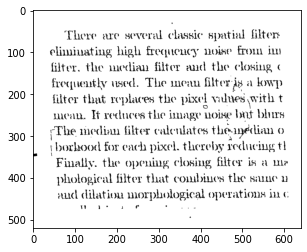

./noisy_data/95.png


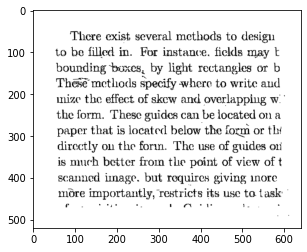

./noisy_data/36.png


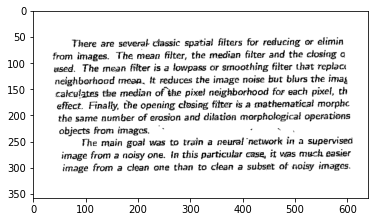

./noisy_data/210.png


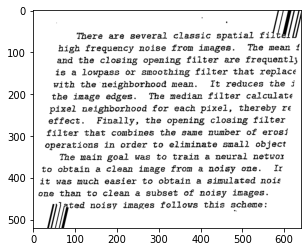

./noisy_data/201.png


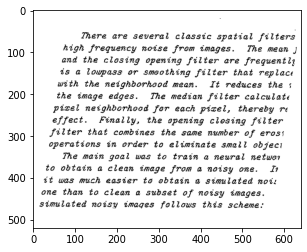

./noisy_data/62.png


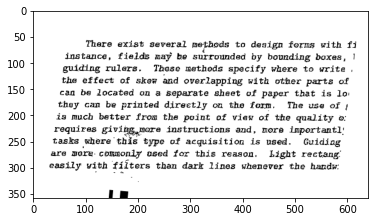

./noisy_data/125.png


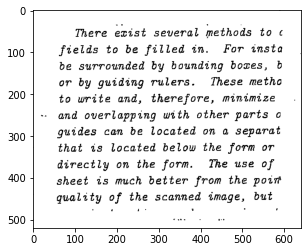

./noisy_data/29.png


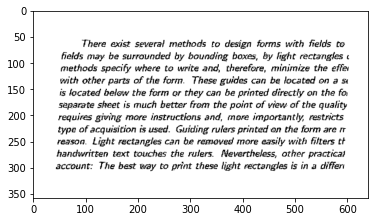

./noisy_data/45.png


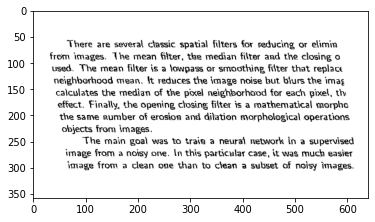

./noisy_data/101.png


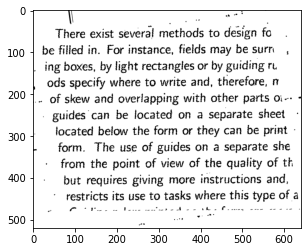

./noisy_data/191.png


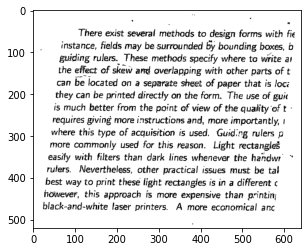

./noisy_data/126.png


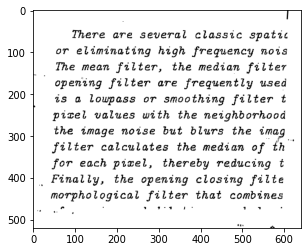

./noisy_data/56.png


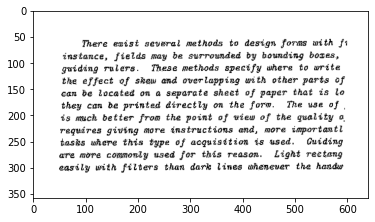

./noisy_data/9.png


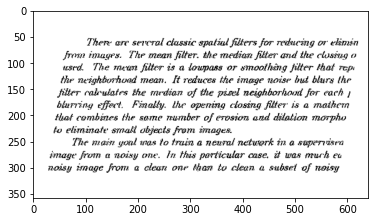

./noisy_data/149.png


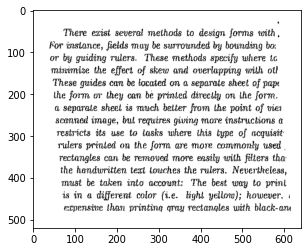

./noisy_data/30.png


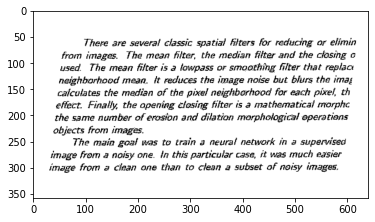

./noisy_data/161.png


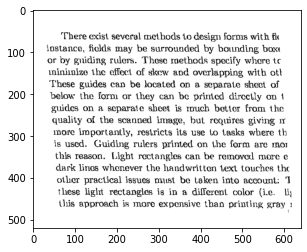

./noisy_data/194.png


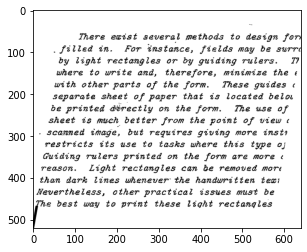

./noisy_data/74.png


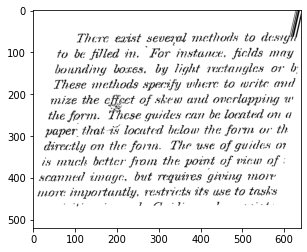

./noisy_data/173.png


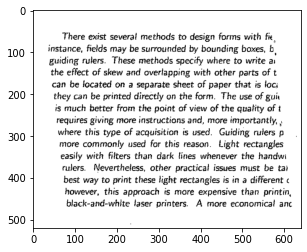

./noisy_data/89.png


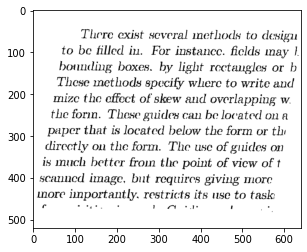

./noisy_data/15.png


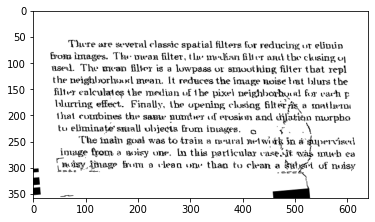

./noisy_data/117.png


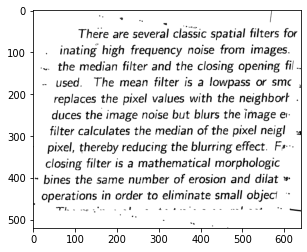

./noisy_data/63.png


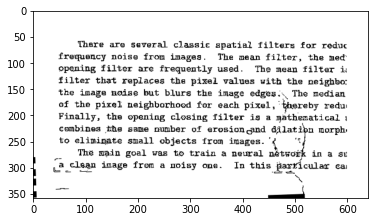

./noisy_data/168.png


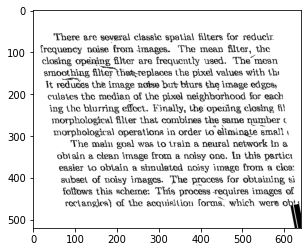

./noisy_data/90.png


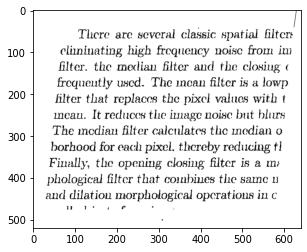

./noisy_data/38.png


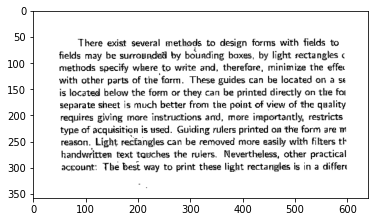

./noisy_data/33.png


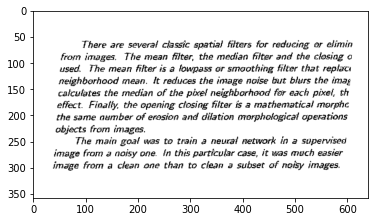

./noisy_data/141.png


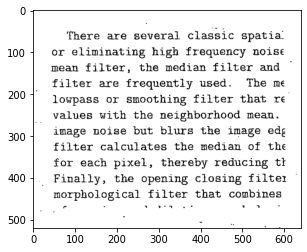

./noisy_data/162.png


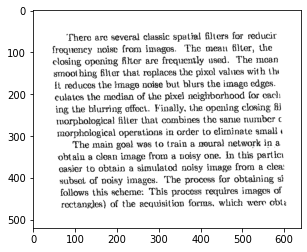

./noisy_data/66.png


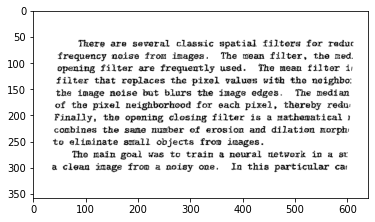

./noisy_data/51.png


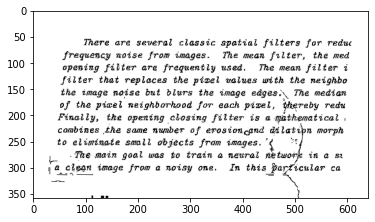

./noisy_data/195.png


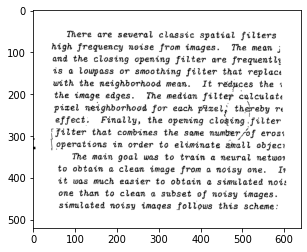

./noisy_data/72.png


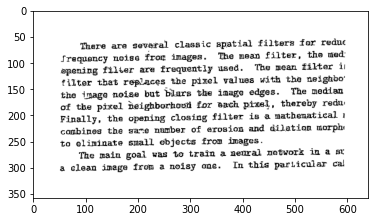

./noisy_data/11.png


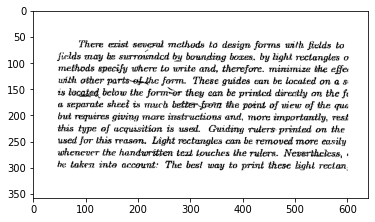

./noisy_data/84.png


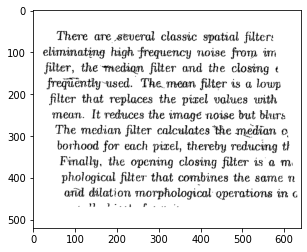

./noisy_data/113.png


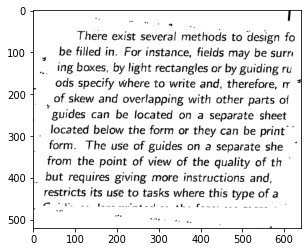

./noisy_data/216.png


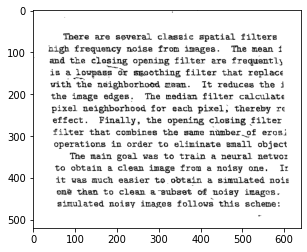

./noisy_data/197.png


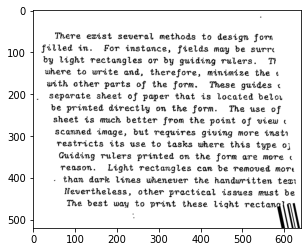

./noisy_data/119.png


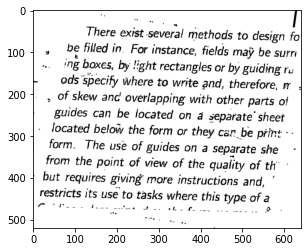

./noisy_data/102.png


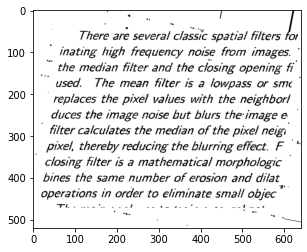

./noisy_data/116.png


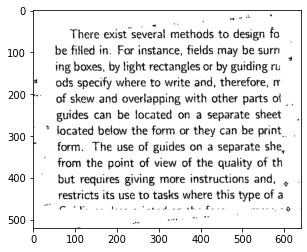

./noisy_data/86.png


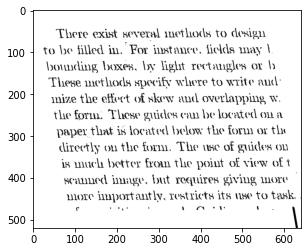

./noisy_data/158.png


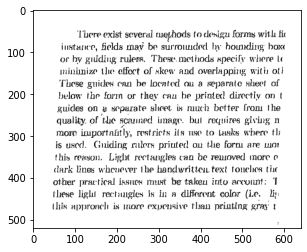

./noisy_data/98.png


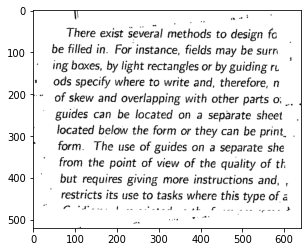

./noisy_data/75.png


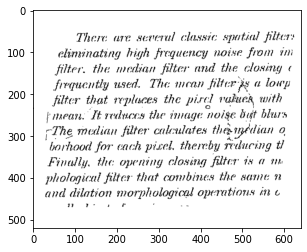

./noisy_data/144.png


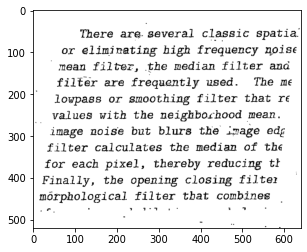

./noisy_data/135.png


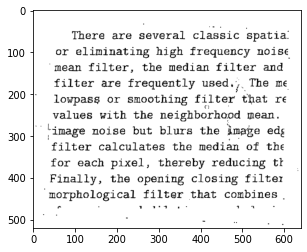

./noisy_data/203.png


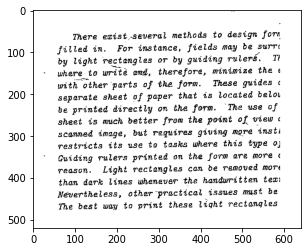

./noisy_data/21.png


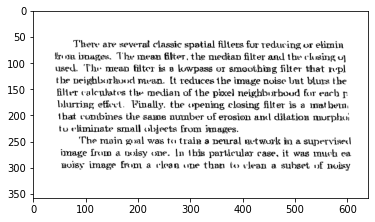

./noisy_data/186.png


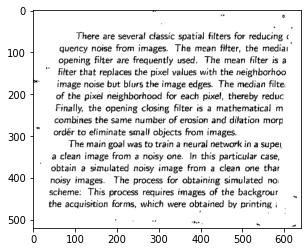

./noisy_data/192.png


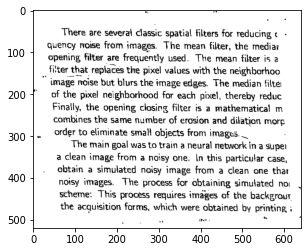

./noisy_data/81.png


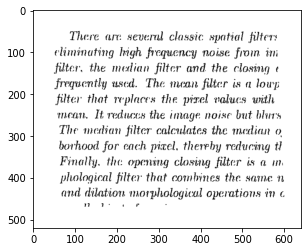

./noisy_data/153.png


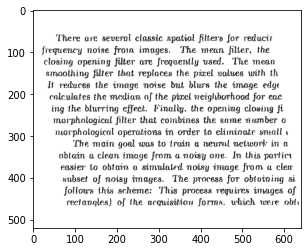

./noisy_data/207.png


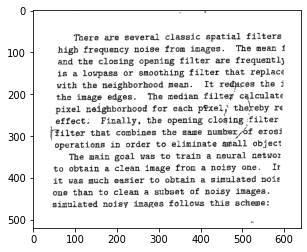

./noisy_data/92.png


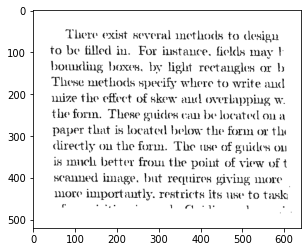

./noisy_data/111.png


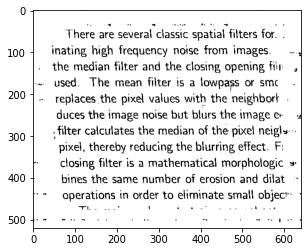

./noisy_data/68.png


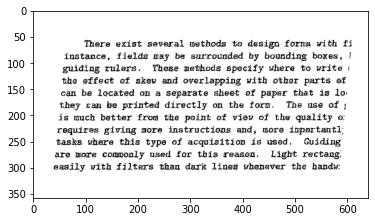

./noisy_data/17.png


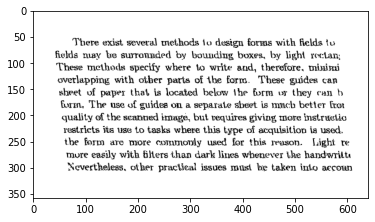

./noisy_data/60.png


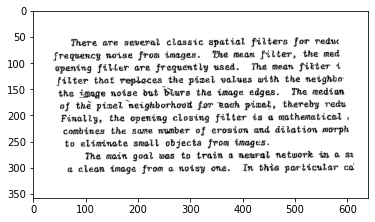

./noisy_data/215.png


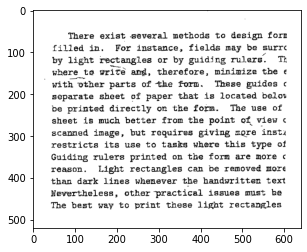

./noisy_data/177.png


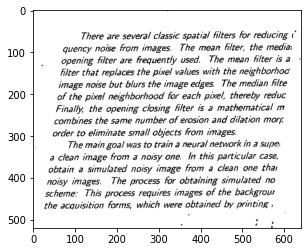

./noisy_data/93.png


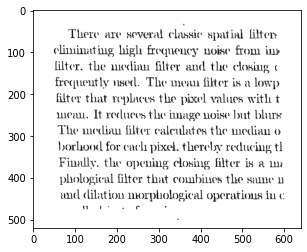

./noisy_data/147.png


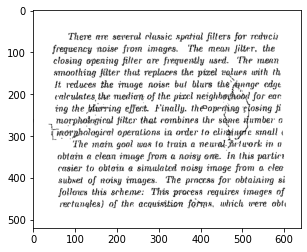

./noisy_data/83.png


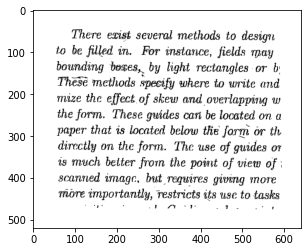

./noisy_data/77.png


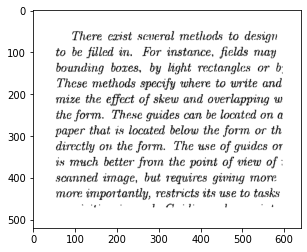

./noisy_data/39.png


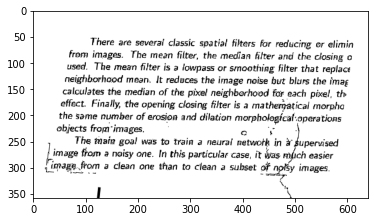

./noisy_data/189.png


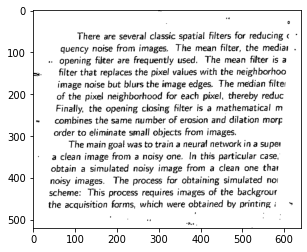

./noisy_data/176.png


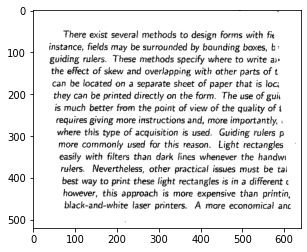

./noisy_data/200.png


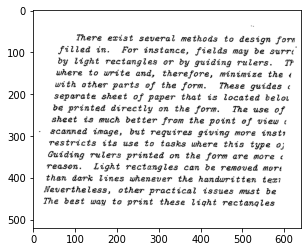

./noisy_data/110.png


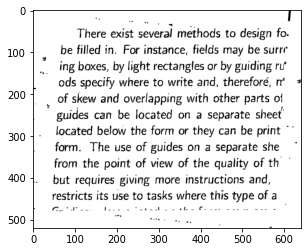

./noisy_data/198.png


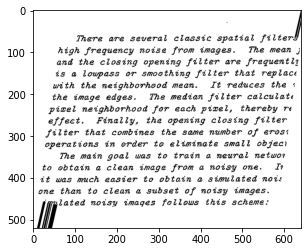

./noisy_data/120.png


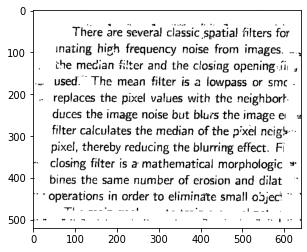

./noisy_data/80.png


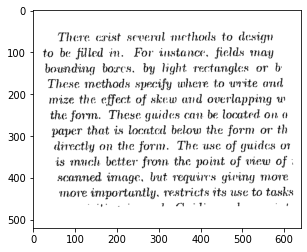

./noisy_data/179.png


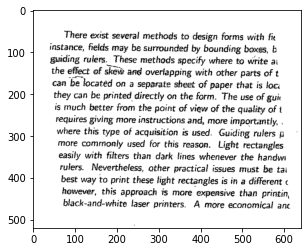

./noisy_data/5.png


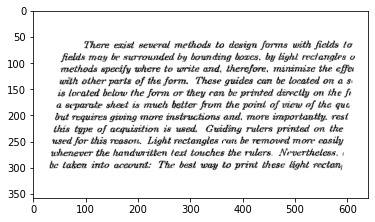

./noisy_data/140.png


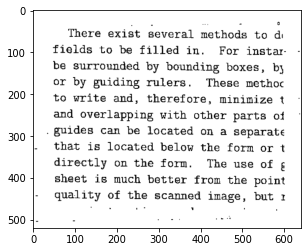

./noisy_data/20.png


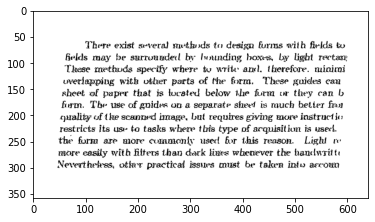

./noisy_data/96.png


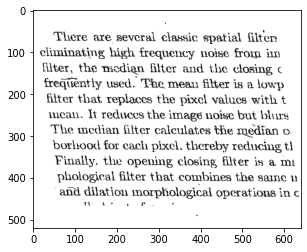

./noisy_data/156.png


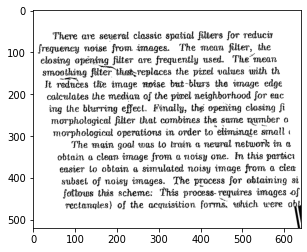

./noisy_data/35.png


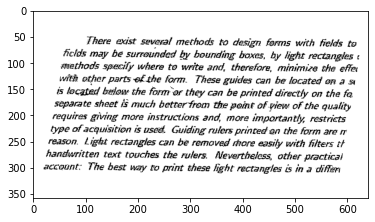

./noisy_data/137.png


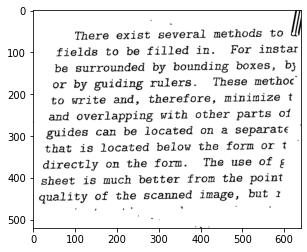

./noisy_data/78.png


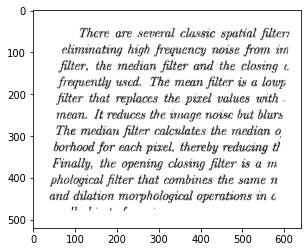

./noisy_data/171.png


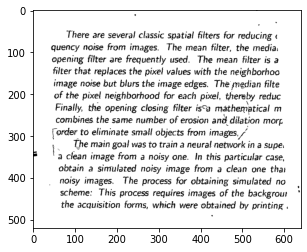

./noisy_data/209.png


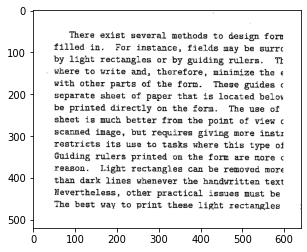

./noisy_data/155.png


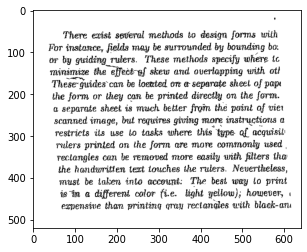

./noisy_data/59.png


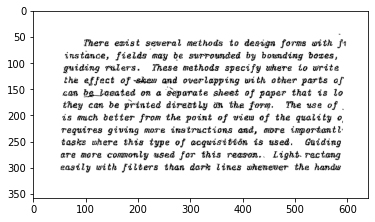

./noisy_data/114.png


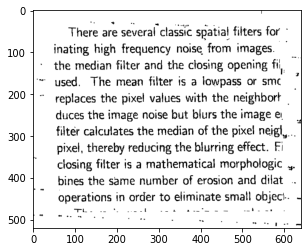

./noisy_data/131.png


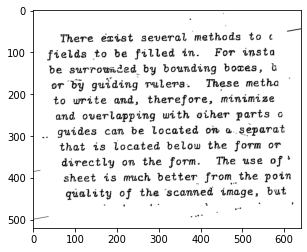

./noisy_data/53.png


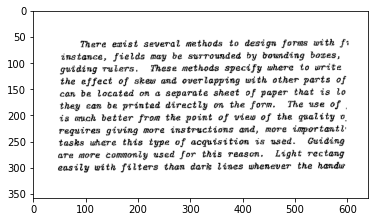

./noisy_data/146.png


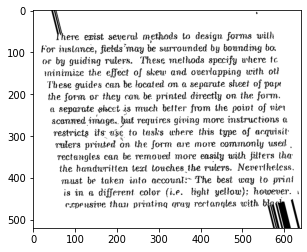

./noisy_data/182.png


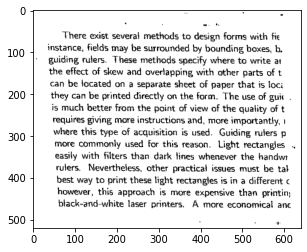

./noisy_data/212.png


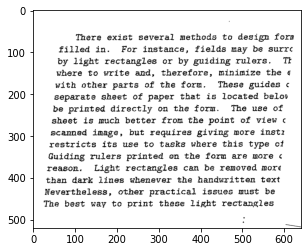

./noisy_data/180.png


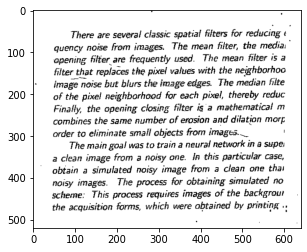

./noisy_data/69.png


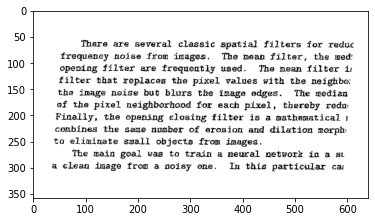

./noisy_data/24.png


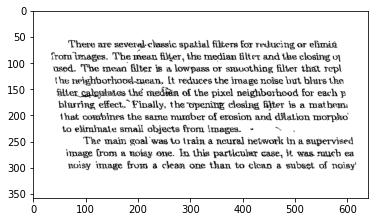

./noisy_data/152.png


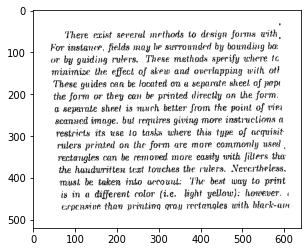

./noisy_data/26.png


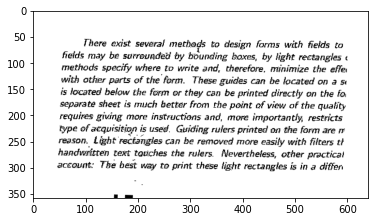

./noisy_data/134.png


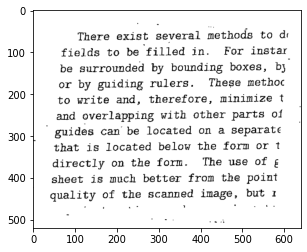

./noisy_data/183.png


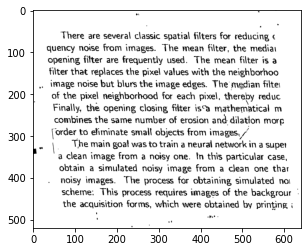

./noisy_data/108.png


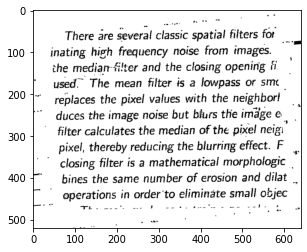

./noisy_data/23.png


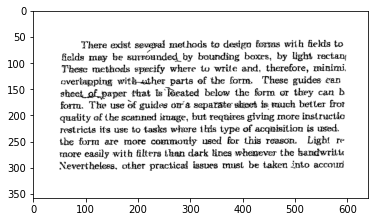

./noisy_data/54.png


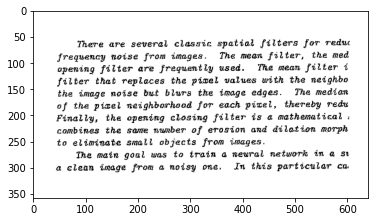

./noisy_data/57.png


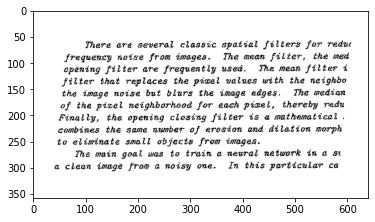

./noisy_data/44.png


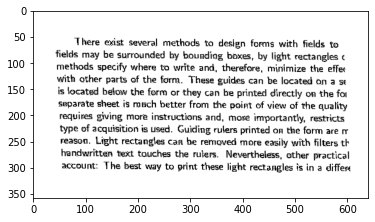

./noisy_data/206.png


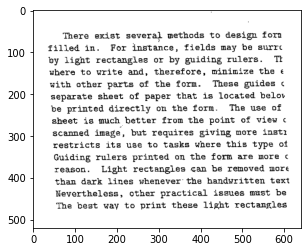

./noisy_data/138.png


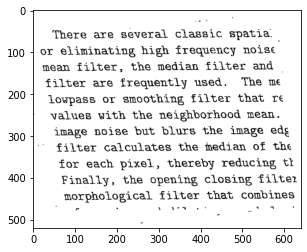

./noisy_data/14.png


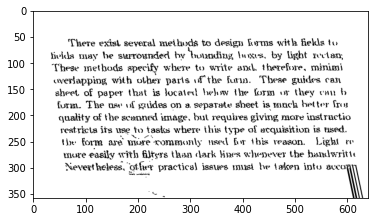

./noisy_data/213.png


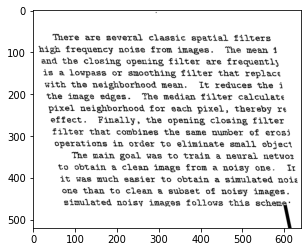

./noisy_data/3.png


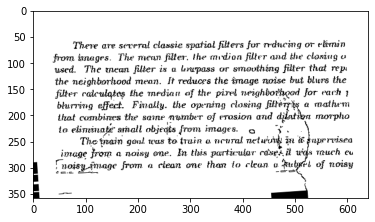

./noisy_data/170.png


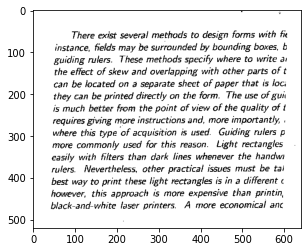

./noisy_data/150.png


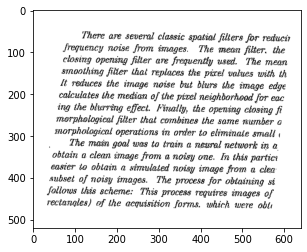

./noisy_data/42.png


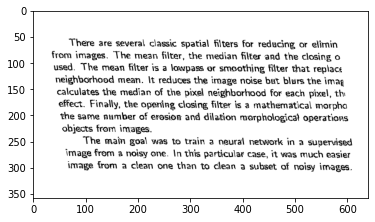

./noisy_data/41.png


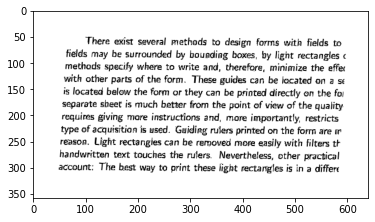

./noisy_data/71.png


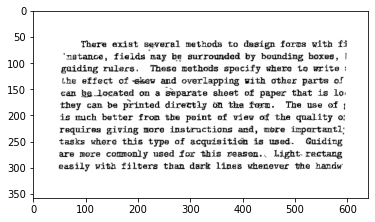

./noisy_data/188.png


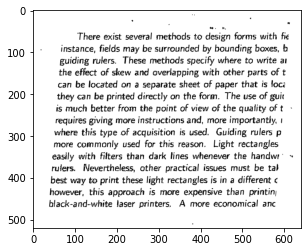

./noisy_data/47.png


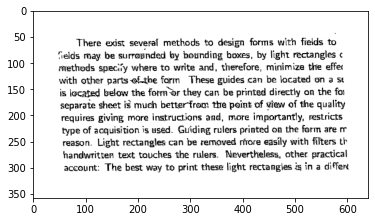

./noisy_data/104.png


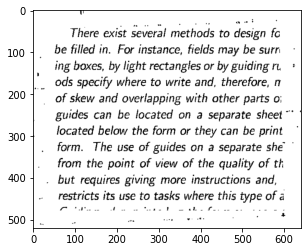

./noisy_data/129.png


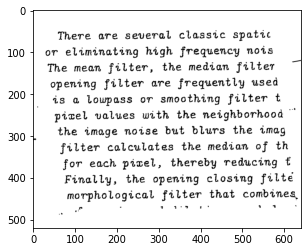

./noisy_data/65.png


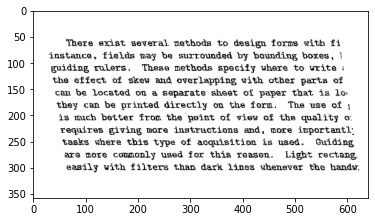

./noisy_data/185.png


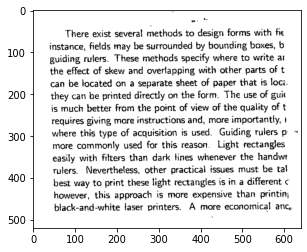

./noisy_data/167.png


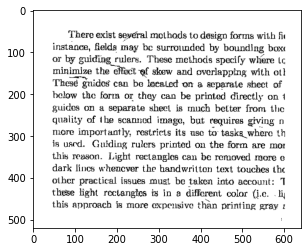

./noisy_data/204.png


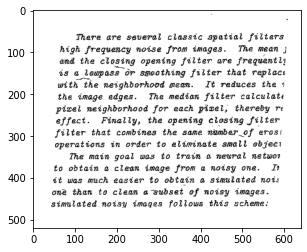

./noisy_data/6.png


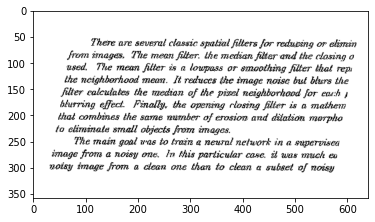

./noisy_data/165.png


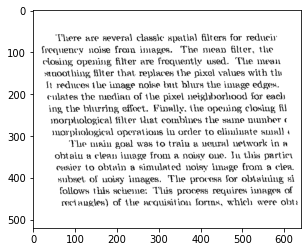

./noisy_data/2.png


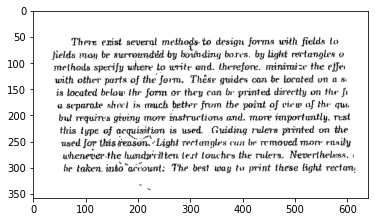

./noisy_data/48.png


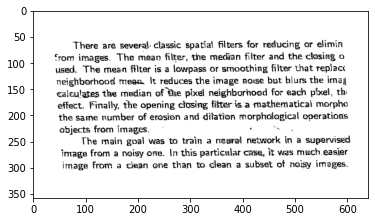

./noisy_data/143.png


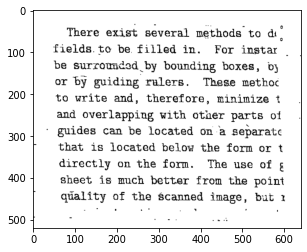

./noisy_data/27.png


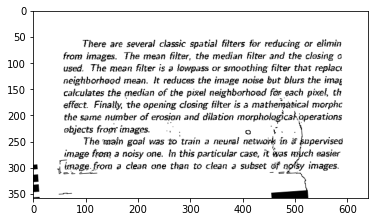

./noisy_data/99.png


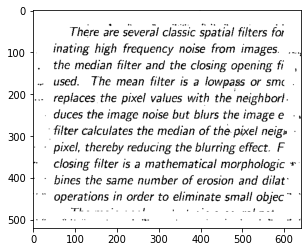

./noisy_data/105.png


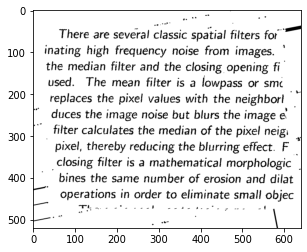

./noisy_data/174.png


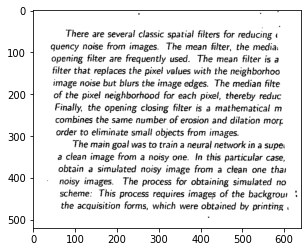

./noisy_data/18.png


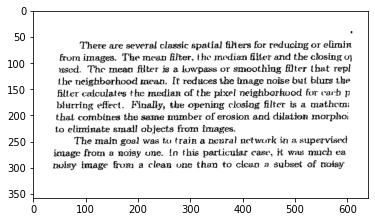

./noisy_data/164.png


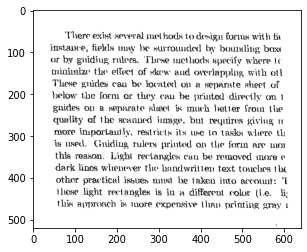

./noisy_data/107.png


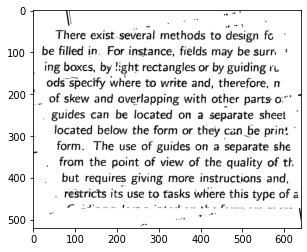

./noisy_data/122.png


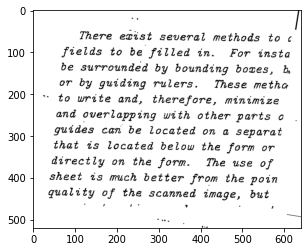

./noisy_data/159.png


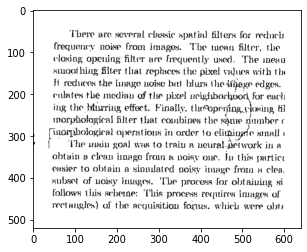

./noisy_data/8.png


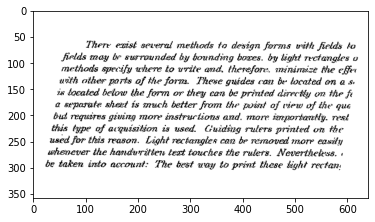

./noisy_data/132.png


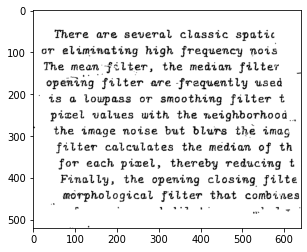

./noisy_data/32.png


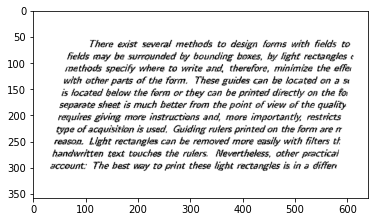

./noisy_data/12.png


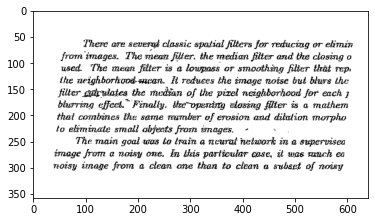

./noisy_data/128.png


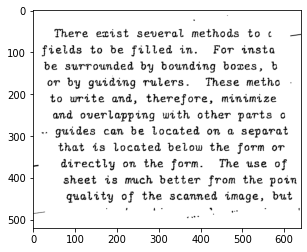

./noisy_data/50.png


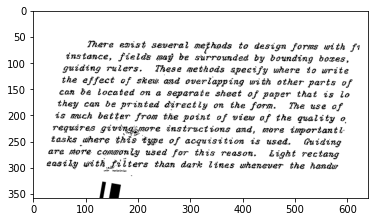

./noisy_data/123.png


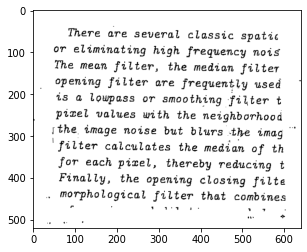

In [4]:
for img_path in image_paths:    
    print(img_path)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    img_bin = binarize(img)
    img_rotated = rotateFrame(img_bin)
    
    plt.imshow(img_rotated, cmap='gray')
    plt.show()
    
    file = img_path.split(os.path.sep)[-1]
    cv2.imwrite('result/' + file, img_rotated)
    